# Erste Schritte mit den MZVM-Daten
Im Notebook wird punktuell Hilfe geboten für das Lesen und Bearbeiten der MCMV-Daten.

Alle Daten findet ihr auf Ilias: https://elearning.hslu.ch/ilias/ilias.php?baseClass=ilrepositorygui&cmd=view&ref_id=6355207. Ladet die Daten herunter und speichert den Ordner *4_DB_csv* im gleichen Verzeichnis wie dieses Notebook ab. Falls ihr auch mit den räumlichen Daten zu den zurückgelegten Routen arbeiten möchtet, müsst ihr auch diese im Verzeichnis speichen (*routen_ch_plausi.gpkg*).

Im Datenpaket ist eine Excel-Datei enthalten, mit Metadaten zu allen Tabellen (*2023-06-05-Datenbankstruktur_MZMV2021_mit_Geodaten.xlsx*). Einerseits kann den Metadaten entnommen werden, wie die Tabellen miteinander zusammenhängen. Zudem wird die Bedeutung aller Spalten und deren Kodierung (z.B. mögliche Werte) erläutert. Es ist zentral, die Datenstruktur zu studieren und sich detaillierte Gedanken darüber zu machen, welche Information für die gegebene Fallstudie relevant ist.

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
%pip install pandas contextily matplotlib seaborn

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import contextily as cx
import requests
import zipfile
import os


# Tabellen verknüpfen

Dreh und Angelpunkt des MZMV-Schemas ist die Haushalte-Tabelle. Alle Tabellen können über das Feld *HHNR* (Identifikator eines Haushaltes) mit der Haushalttabelle (oder miteinander) verknüpft werden. 

Problematisch, und im Schema nicht ersichtlich, ist der Umstand, dass viele Tabellen eine 1:n Beziehung zu den Haushalten haben. Ein Haushalt kann in der Überwachungsperiode beispielsweise viele Wege zurückgelegt haben (oder er hat mehrere Zielpersonen oder Fahrzeuge etc.). Das erschwert die Verknüpfung von Tabellen. Insbesondere wenn man als Resultat der Verknüpfung eine 'flache Tabelle' haben möchte, also eine Tabelle, welche pro Stichprobe (d.h. Haushalt) eine Zeile enthält und einfach einem statistischen Modell übergeben werden kann (auch Tabellen mit Mehrfachmessungen können statistisch modelliert werden. Es bedarf aber meist komplexerer Modelle).

Im Folgenden findet ihr ein Beispiel, wie die Haushalte-Tabelle mit den Wegen, Fahrzeugen und Dienstleistungen verknüpft wird. Für diesen Zweck muss beispielsweise die Information der Wege pro Haushalt in einer Zeile zusammengefasst und deshalb auf Spalten übertragen werden. Das nennt man long2wide-Transformation.

## Haushaltsdaten lesen

Erst lesen wir die Haushalte-Tabelle...


In [3]:
hh = pd.read_csv("./4_DB_csv/haushalte.csv", sep=";", encoding = "ISO-8859-1") # ISO Encoding um Umlaute richtig einzulesen
hh.head(5)

,HHNR,WM,DMOD,intwdate,sprache,ZEIT_HH,W_X,W_Y,W_QAL,W_BFS,...,f80211e,f80211f,f80211g,f80300,f80400a,f80400b,f80400c,f80400d,f20601,ALTEL
0,110001,1.391603,2,05.03.2021,2,7.133333,6.559870,46.549366,1,5624,...,-99,-99,-99,-99,-99,-99,-99,-99,5,2
1,110008,0.484276,2,03.03.2021,2,7.166667,6.635652,46.785591,1,5938,...,-99,-99,-99,-99,-99,-99,-99,-99,3,2
2,110011,0.161184,3,04.02.2021,1,9.516667,9.112485,47.451677,1,3408,...,0,0,0,1,2,-99,-99,-99,-99,2
3,110024,0.411859,2,07.04.2021,1,3.866667,7.499629,46.897868,1,861,...,-99,-99,-99,-99,-99,-99,-99,-99,-99,2
4,110026,1.036084,1,14.04.2021,1,5.383333,8.658613,47.724048,1,2939,...,-99,-99,-99,-99,-99,-99,-99,-99,2,2


In [4]:
hh.shape

(55018, 94)

Unser Sample umfasst 55k Haushalte. Die Haushalte-Tabelle umfasst 94 Attribute.

## Wege aufbereiten und joinen
Jeder Haushalt kann viele Wege zu unterschiedlichen Zwecken und mit unterschiedlichen Verkehrsmitteln zurücklegen. Nachfolgend wird eine Tabelle erstellt, welche einfach mit den Haushalten zusammgeführt werden kann. Jede Zeile entspricht einem Haushalt. Pro Zeile sind alle Wegstrecken pro Zweck und, in einem separaten Rechenschritt, pro Verkehrsmittel aufsummiert.

In [5]:
weg = pd.read_csv("./4_DB_csv/wegeInland.csv", sep=";", encoding = "ISO-8859-1")
weg.head(5)


,HHNR,WP,AUSNR,WEGNR,DMOD,f51100,f51400,f51100time,f51400time,pseudo,...,w_luftlin,w_rdist,wmittel1,wmittel1a,wmittel2,wmittel2a,wzweck1,wzweck2,wzweck3,w_dist_obj2
0,110001,1.606924,1,1,2,555,565,9:15:00,9:25:00,1,...,0.333127,0.413,8,2,8,2,5.0,1,5,0.333
1,110001,1.606924,1,2,2,575,580,9:35:00,9:40:00,1,...,0.863416,1.483,8,2,8,2,4.0,1,4,0.863
2,110001,1.606924,1,3,2,610,620,10:10:00,10:20:00,1,...,1.123565,1.407,8,2,8,2,4.0,2,4,1.124
3,110001,1.606924,2,4,2,750,760,12:30:00,12:40:00,1,...,2.167349,3.973,8,2,8,2,8.0,1,8,2.167
4,110001,1.606924,2,5,2,810,825,13:30:00,13:45:00,1,...,3.127501,4.811,8,2,8,2,5.0,1,5,3.128


### Weg-Zweck

In [6]:
# Hilfstabelle, um sinnvolle Spaltennamen zu erhalten -> kopiert vom Metadaten-XLS
data = {
    'wzweck1': [-99, -98, -97, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
    'zweck': [
        'Pseudoetappe',
        'keine Antwort',
        'weiss nicht',
        'Umsteigen, Verkehrsmittelwechsel, Auto abstellen',
        'Arbeiten',
        'Ausbildung, Schule',
        'Einkaufen',
        'Besorgungen und Inanspruchnahme von Dienstleistungen',
        'Geschäftliche Tätigkeit',
        'Dienstfahrt',
        'Freizeitaktivität',
        'Begleitweg (nur Kinder)',
        'Begleitweg/Serviceweg (Andere, z.B. Behinderte)',
        'Rückkehr nach Hause bzw. auswärtige Unterkunft',
        'Anderes',
        'Grenzübergang'
    ]
}

# Creating the DataFrame
weg_zweck = pd.DataFrame(data)

# Präfix an alle Namen, damit die Information nach der long2wide Tranformation noch gefunden wird
weg_zweck['zweck'] = 'weg_typ_' + weg_zweck['zweck'].str.replace(r'[^a-zA-Z0-9]', '', regex=True)

In [7]:
# Aggregation der Distanzen pro Haushalt und Zweck
weg_zweck_agg = weg.groupby(['HHNR', 'wzweck1']).agg({'w_rdist': 'sum'}).reset_index()

# Join mit sinnvollen Beschreibungen des Zwecks
weg_zweck_agg = pd.merge(weg_zweck_agg, weg_zweck, on='wzweck1', how='left')

# Pivot um lange in breite Tabelle zu transformieren (nur eine Zeile pro Haushalt)
weg_zweck_wide = weg_zweck_agg.pivot(index='HHNR', columns='zweck', values='w_rdist')

# NaN mit 0 ersetzen
weg_zweck_wide = weg_zweck_wide.fillna(0).reset_index()
weg_zweck_wide = weg_zweck_wide.clip(lower=0)

# Gesamtstrecke aufsummieren
weg_zweck_wide["weg_typ_total"] = round(weg_zweck_wide.iloc[:,2:].sum(axis=1),2)

weg_zweck_wide.head(5)

zweck,HHNR,weg_typ_Anderes,weg_typ_Arbeiten,weg_typ_AusbildungSchule,weg_typ_BegleitwegServicewegAnderezBBehinderte,weg_typ_BegleitwegnurKinder,weg_typ_BesorgungenundInanspruchnahmevonDienstleistungen,weg_typ_Dienstfahrt,weg_typ_Einkaufen,weg_typ_Freizeitaktivitt,weg_typ_GeschftlicheTtigkeit,weg_typ_Pseudoetappe,weg_typ_RckkehrnachHausebzwauswrtigeUnterkunft,weg_typ_keineAntwort,weg_typ_weissnicht,weg_typ_total
0,110001,0.0,0.00,0.0,0.0,0.0,5.224,0.0,2.890,6.309,0.0,0.0,0.0,0.0,0.0,14.42
1,110008,0.0,0.00,0.0,0.0,0.0,0.000,0.0,1.134,9.040,0.0,0.0,0.0,0.0,0.0,10.17
2,110011,0.0,0.00,0.0,0.0,0.0,0.000,0.0,0.000,0.556,0.0,0.0,0.0,0.0,0.0,0.56
3,110024,0.0,21.39,0.0,0.0,0.0,0.000,0.0,0.075,0.000,0.0,0.0,0.0,0.0,0.0,21.46
4,110026,0.0,0.00,0.0,0.0,0.0,7.475,0.0,0.000,12.474,0.0,0.0,0.0,0.0,0.0,19.95


### Weg-Verkehrsmittel

In [9]:
# Hilfstabelle, um sinnvolle Spaltennamen zu erhalten
data = {
    'wmittel1a': [-99, 1, 2, 3, 4],
    'verkehrsmittel': ['Pseudoetappe', 'LV', 'MIV', 'OeV', 'Andere'],
}
weg_hmittel = pd.DataFrame(data)

weg_hmittel['verkehrsmittel'] = 'weg_vm_' + weg_hmittel['verkehrsmittel'].str.replace(r'[^a-zA-Z0-9]', '', regex=True)

In [10]:
# Aggregation der Distanzen pro Haushalt und Zweck
weg_hmittel_agg = weg.groupby(['HHNR', 'wmittel1a']).agg({'w_rdist': 'sum'}).reset_index()

# Join mit sinnvollen Beschreibungen des Zwecks
weg_hmittel_agg = pd.merge(weg_hmittel_agg, weg_hmittel, on='wmittel1a', how='left')

# Pivot um lange in breite Tabelle zu transformieren (nur eine Zeile pro Haushalt)
weg_hmittel_wide = weg_hmittel_agg.pivot(index='HHNR', columns='verkehrsmittel', values='w_rdist')

# NaN mit 0 ersetzen
weg_hmittel_wide = weg_hmittel_wide.fillna(0).reset_index()
weg_hmittel_wide = weg_hmittel_wide.clip(lower=0)

# Gesamtstrecke aufsummieren
weg_hmittel_wide["weg_vm_total"] = round(weg_hmittel_wide.iloc[:,2:].sum(axis=1),2)

weg_hmittel_wide.head(5)

verkehrsmittel,HHNR,weg_vm_Andere,weg_vm_LV,weg_vm_MIV,weg_vm_OeV,weg_vm_Pseudoetappe,weg_vm_total
0,110001,0.0,0.000,14.423,0.000,0.0,14.42
1,110008,0.0,10.174,0.000,0.000,0.0,10.17
2,110011,0.0,0.556,0.000,0.000,0.0,0.56
3,110024,0.0,0.150,0.000,21.315,0.0,21.46
4,110026,0.0,2.500,0.000,17.449,0.0,19.95


### Join

Haushalte und Wege, d.h. Zweck und Verkehrsmittel, werden schrittweise zusammengeführt.

In [11]:
hh_weg = pd.merge(hh, weg_zweck_wide, on='HHNR', how='left')
hh_weg = pd.merge(hh_weg, weg_hmittel_wide, on='HHNR', how='left')

hh_weg.head(5)

,HHNR,WM,DMOD,intwdate,sprache,ZEIT_HH,W_X,W_Y,W_QAL,W_BFS,...,weg_typ_RckkehrnachHausebzwauswrtigeUnterkunft,weg_typ_keineAntwort,weg_typ_weissnicht,weg_typ_total,weg_vm_Andere,weg_vm_LV,weg_vm_MIV,weg_vm_OeV,weg_vm_Pseudoetappe,weg_vm_total
0,110001,1.391603,2,05.03.2021,2,7.133333,6.559870,46.549366,1,5624,...,0.0,0.0,0.0,14.42,0.0,0.000,14.423,0.000,0.0,14.42
1,110008,0.484276,2,03.03.2021,2,7.166667,6.635652,46.785591,1,5938,...,0.0,0.0,0.0,10.17,0.0,10.174,0.000,0.000,0.0,10.17
2,110011,0.161184,3,04.02.2021,1,9.516667,9.112485,47.451677,1,3408,...,0.0,0.0,0.0,0.56,0.0,0.556,0.000,0.000,0.0,0.56
3,110024,0.411859,2,07.04.2021,1,3.866667,7.499629,46.897868,1,861,...,0.0,0.0,0.0,21.46,0.0,0.150,0.000,21.315,0.0,21.46
4,110026,1.036084,1,14.04.2021,1,5.383333,8.658613,47.724048,1,2939,...,0.0,0.0,0.0,19.95,0.0,2.500,0.000,17.449,0.0,19.95


In [12]:
hh_weg.shape

(55018, 115)

Die Tabelle ist flach (die Anzahl Spalten hat sich nicht geändert), hat also nur einen Eintrag pro Haushalt, jedoch sehr breiter als davor. Alle Zwecke und Verkehrsmittel haben nun eine eigene Spalte. Das ist nicht sehr übersichtlich aber ganz gut für die statistische Modellierung der Daten.

## Dienstleistungen

Beispielhaft werden hier noch die Dienstleistungen hinzugefügt, welche für jeden Haushalt zur Verfügung stehen. Hypothetisch sind fehlende, bzw. weite Distanzen zu, Dienstleistungen eine wichtige Erklärung für weite Wegstrecken im Alltag.

In [13]:
dienst = pd.read_csv("./4_DB_csv/dienstleistungen.csv", sep=";", encoding = "ISO-8859-1")
dienst = dienst.clip(lower=0)
dienst = dienst.fillna(0)

In [14]:
hh_weg_dienst = pd.merge(hh_weg, dienst, on='HHNR', how='left')
hh_weg_dienst.head(5)

,HHNR,WM_x,DMOD,intwdate,sprache,ZEIT_HH,W_X,W_Y,W_QAL,W_BFS,...,D_STOP_2,D_STOP_3,D_STOP_4,D_STOP_5,D_STOP_TOT,D_MUSEUM,D_FOREST,D_LAKE,D_SWIM,D_ZOO
0,110001,1.391603,2,05.03.2021,2,7.133333,6.559870,46.549366,1,5624,...,1.028,0.938,0.341,0.553,0.341,2.846,1.402,4.822,3.290,7.633
1,110008,0.484276,2,03.03.2021,2,7.166667,6.635652,46.785591,1,5938,...,0.716,1.064,0.094,0.282,0.094,1.104,0.488,0.801,1.064,30.115
2,110011,0.161184,3,04.02.2021,1,9.516667,9.112485,47.451677,1,3408,...,7.042,2.717,2.645,0.109,0.109,3.991,0.701,3.201,3.088,14.222
3,110024,0.411859,2,07.04.2021,1,3.866667,7.499629,46.897868,1,861,...,5.866,1.306,0.193,1.658,0.193,1.154,1.109,9.740,3.865,7.113
4,110026,1.036084,1,14.04.2021,1,5.383333,8.658613,47.724048,1,2939,...,1.149,0.825,0.209,0.534,0.209,4.076,0.374,15.008,4.688,32.344


## Fahrzeuge

Jeder Haushalt kann mehrere Fahrzeuge haben. Da wir nicht wissen, welche Wege mit welchem Fahrzeug zurückgelegt wurden, können wir die Annahme treffen, dass es sich jeweils um das wenigst effiziente Fahrzeug gehandelt hat (immer vom Schlimmsten ausgehen:). Wir aggregieren die Tabelle deshalb so, dass pro Haushalt nur das Fahrzeug mit der geringsten Effizienz behalten wird.

In [15]:
fz = pd.read_csv("./4_DB_csv/fahrzeuge.csv", sep=";", encoding = "ISO-8859-1")

In [16]:
# fehlende effizienz mit Effizienzklasse D ersetzen
fz['mf_eekat'] = fz['mf_eekat'].fillna('D')

# fahrzeuge nach haushalt, art und effizienz sortieren
fz_sorted = fz.sort_values(by=['HHNR', 'fahrzeugart', 'mf_eekat'], ascending=[True, True, False])

# pro Haushalt nur erstes Fahrzeug behalten (Auto, falls Auto und Motorrad / schlechteste Effizienz, falls mehrere Autos, etc.)
fz_agg = fz_sorted.groupby('HHNR').first().reset_index()

fz_agg.head(5)

,HHNR,WM,fznum,fahrzeugart,f30400,f30600_31500,f30601_31501,f30700_hpnr1,f30700_hpnr2,f30700_hpnr3,...,mf_gege1,mf_zylin,mf_nuzla,Leergew,mf_antri,mf_leikw,mf_co2wt,mf_tysnr,ET_Verbrauch,EL_Verbrauch
0,110001,1.391603,2,1,1,-97,-99,2,-99,-99,...,-99,-99,-99,-99.0,-99,-99,-99,1LD822,-99.0,-99.0
1,110008,0.484276,1,1,1,2012,9,1,2,-99,...,2050,4,504,1546.0,1,14700,155,1CE433,6.7,-99.0
2,110011,0.161184,1,1,1,-97,-99,3,-99,-99,...,-99,-99,-99,-99.0,-99,-99,-99,None,-99.0,-99.0
3,110026,1.036084,1,2,-99,2015,-99,-99,-99,-99,...,-99,-99,-99,-99.0,-99,-99,-99,None,-99.0,-99.0
4,110027,0.584383,3,1,1,-97,-99,3,-99,-99,...,-99,-99,-99,-99.0,-99,-99,-99,1HA350,-99.0,-99.0


In [17]:
hh_weg_dienst_fz = pd.merge(hh_weg_dienst, fz_agg, on='HHNR', how='left')

hh_weg_dienst_fz.head(5)

,HHNR,WM_x,DMOD,intwdate,sprache,ZEIT_HH,W_X,W_Y,W_QAL,W_BFS,...,mf_gege1,mf_zylin,mf_nuzla,Leergew,mf_antri,mf_leikw,mf_co2wt,mf_tysnr,ET_Verbrauch,EL_Verbrauch
0,110001,1.391603,2,05.03.2021,2,7.133333,6.559870,46.549366,1,5624,...,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,1LD822,-99.0,-99.0
1,110008,0.484276,2,03.03.2021,2,7.166667,6.635652,46.785591,1,5938,...,2050.0,4.0,504.0,1546.0,1.0,14700.0,155.0,1CE433,6.7,-99.0
2,110011,0.161184,3,04.02.2021,1,9.516667,9.112485,47.451677,1,3408,...,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,None,-99.0,-99.0
3,110024,0.411859,2,07.04.2021,1,3.866667,7.499629,46.897868,1,861,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,110026,1.036084,1,14.04.2021,1,5.383333,8.658613,47.724048,1,2939,...,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,None,-99.0,-99.0


Die Tabelle enthält nun die zurückgelegten Wege pro Haushalt und welches Verkehrsmittel benutzt wurde. Falls es sich dabei um das eigene Fahrzeug handelt haben wir Angaben dazu, um was für ein Auto (Motorrad) es sich handelt. Das sind ausreichend Informationen um anhand des [Emissionsrechners](https://www.energieschweiz.ch/programme/umweltrechner-verkehr/
) von Energieschweiz die CO2-Äquivalente zu berechnen.

# Explorative Visualisierung

Ein paar Beispiele für explorative Visualisierungen.

## Modalsplit

Wie verteilen sich die Weg-Distanzen auf die unterschiedlichen Verkehrsmittel?

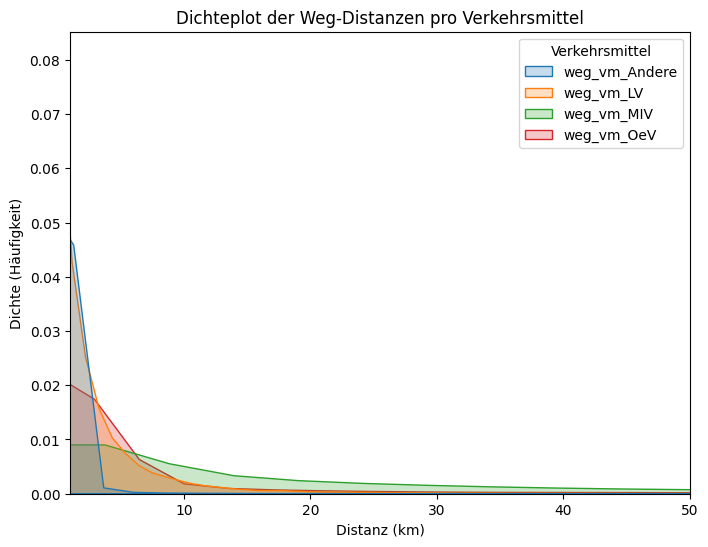

In [18]:
hh_weg_dienst_fz_l = pd.melt(hh_weg_dienst_fz, id_vars=['HHNR'], 
                  value_vars=['weg_vm_Andere','weg_vm_LV','weg_vm_MIV','weg_vm_OeV'], 
                  var_name='Verkehrsmittel', value_name='Distanz')

plt.figure(figsize=(8, 6))
sns.kdeplot(data=hh_weg_dienst_fz_l, x='Distanz', hue='Verkehrsmittel', fill=True)

plt.title('Dichteplot der Weg-Distanzen pro Verkehrsmittel')
plt.xlabel('Distanz (km)')
plt.ylabel('Dichte (Häufigkeit)')
plt.xlim(1, 50)
plt.show()

Viel sieht man nicht in diesem Dichteplot. Mit Boxplots ist es leider nicht besser, da die Outlier das Bild dominieren. Was ersichtlich ist; die durchschnittlich zurückgelegten Strecken pro Haushalt sind klein beim LV (langsam Verkehr), grösser wenn ein öffentliches Verkehrsmittel benutzt wird (OeV) und am grössten für den MIV (Auto). Das entspricht unserer Erwartung.

In [19]:
# statistische zusammenfassung
summary_stats = hh_weg_dienst_fz_l.groupby('Verkehrsmittel')['Distanz'].agg(
    min='min',
    max='max',
    mean='mean',
    median='median',
    std = 'std',
    sum = 'sum'
).reset_index()
print(summary_stats)

  Verkehrsmittel  min      max       mean  median        std          sum
0  weg_vm_Andere  0.0  465.513   0.673062   0.000   9.843960    30587.982
1      weg_vm_LV  0.0  207.158   2.449835   0.502   5.756586   111335.201
2     weg_vm_MIV  0.0  979.999  24.039065   4.799  47.269076  1092479.355
3     weg_vm_OeV  0.0  682.439   7.411756   0.000  31.993285   336834.645


Die Zahlen in der obigen Zusammenfassung passen ganz gut zu den Aussagen im [Bericht zum MZVM](https://www.are.admin.ch/are/de/home/mobilitaet/grundlagen-und-daten/mzmv.html).

## Korrelation zwischen Weg-Distanzen und der Distanzen zu Dienstleistungen

Für den Vergleich von mehreren numerischen Attributen eignen sich Korrelations-Matrizen sehr gut. Hier werden Distanzen zu Dienstleistungen am Wohnort mit zurückgelgten Wegdistanzen verglichen. Einmal pro Typ von Wegdistanz und einmal pro Art des Verkehrsmittels.

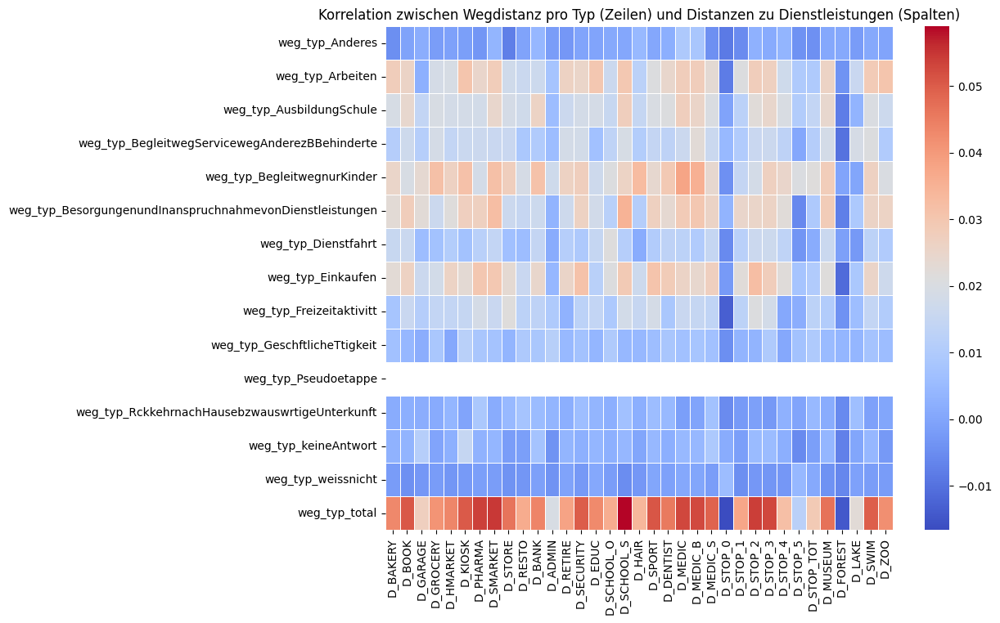

In [20]:
# Distanz-Spalten auswählen
service_cols = [col for col in hh_weg_dienst.columns if "D_" in col]
travel_cols = [col for col in hh_weg_dienst.columns if "weg_typ_" in col]

# Daten filtern
hh_weg_dienst_f = hh_weg_dienst[service_cols + travel_cols]

# Korrelationsmatrix berechnen
corr_matrix = hh_weg_dienst_f.corr()

# Korrelationsmatrix filtern
corr_matrix_f = corr_matrix.loc[travel_cols, service_cols]

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_f, cmap='coolwarm', linewidths=0.5)
plt.title("Korrelation zwischen Wegdistanz pro Typ (Zeilen) und Distanzen zu Dienstleistungen (Spalten)")
plt.show()

Die detaillierte Interpretation der Korrelationsmatrizen überlassen wir gerne euch. Grundsätzlich sind die Korrelationen aber klein (sowohl im negativen wie im positiven Bereich). Distanzen zu Dienstleistungen sind also nur sehr bedingt gute Prädiktoren für weite Wegdistanzen. Positive Korrelationen lassen sich vor allem für die Summe aller Wegdistanzen aufzeigen.

# Geographische Daten

Dem Datenpaket liegt auch ein räumlicher Datensatz bei, ein sogenanntes GeoPackage. Im nachfolgenden wird kurz erläutert, wie ihr damit Rechnen könnt. Geopandas und Python im Allgemeinen sind aber nicht super für diese Aufgabe geeignet. Falls ihr ausführlich mit den räumlichen Daten arbeiten möchtet, empfiehlt es sich ein GIS zu verwenden (z.B. [QGIS](https://www.qgis.org/download/)).

## Geopandas lesen

Die zurückgelegten Reisewege stehen als räumliche Geometrie-Daten, d.h. Linien, zur Verfügung. Es handelt sich um sogenannte GeoPackage Daten. Diese können mit GeoPandas gelesen und (bedingt) verarbeitet werden. Wir fügen den Geometriedaten noch die Metadaten aus der Etappen-Tabelle hinzu, um ein bisschen mehr über die einzelnen Strecken zu wissen.

In [21]:
# GeoPackage als Geopandas lesen
weg_geo = gpd.read_file("routen_ch_plausi.gpkg")

# Etappen lesen und joinen
etappen = pd.read_csv("4_DB_csv/etappen.csv", sep=";", encoding = "ISO-8859-1")
etappen['HHNR'] = etappen['HHNR'].astype(str)

# Übersetzung der Verkehrsmittel ID in lesbare Information
data = {
    'f51300': [-99, -98, -97, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 95],
    'Verkehrsmittel': [
        'Pseudoetappe',
        'Keine Antwort',
        'Weiss nicht',
        'Zu Fuss',
        'Velo',
        'E-Bike ohne Kontrollschild',
        'E-Bike mit gelbem Kontrollschild',
        'Mofa, Motorfahrrad',
        'Kleinmotorrad (ab 16 J.)',
        'Motorrad als Fahrer',
        'Motorrad als Mitfahrer',
        'Auto als Fahrer',
        'Auto als Mitfahrer',
        'Bahn/Zug',
        'Bus, Postauto, Schulbus',
        'Tram/Metro',
        'Taxi (im "klassischen" Sinn)',
        'Taxi-ähnliche Fahrdienste (z.B. Uber)',
        'Reisecar',
        'Lastwagen',
        'Schiff, Boot',
        'Flugzeug/Luftfahrzeug',
        'Zahnradbahn, Standseilbahn, Seilbahn, Sessellift, Skilift',
        'Fahrzeugähnliche Geräte',
        'Anderes'
    ]
}

# Creating the DataFrame
etappen_verkehrsmittel = pd.DataFrame(data)
etappen = pd.merge(etappen, etappen_verkehrsmittel, on=['f51300'], how='inner')

weg_geo = pd.merge(weg_geo, etappen, on=['GIS_E_ID', 'f51300', 'HHNR', 'rdist'], how='inner')

Die Daten enthalten eine normale Pandas Tabelle. Die letzte Spalte ist speziell, da hier die Geometrie der zurückgelegten Wege gespeichert ist: als Linestring mit Koordinatenpaaren.

In [22]:
weg_geo.head()

,HHNR,GIS_E_ID,f51300,rdist,length,gppkm,geometry,WP,ETNR,WEGNR,...,km_Str2,km_Str3,km_Str4,km_Str5,km_Str6,km_Str7,km_Str8,GIS_Rech,HAF_FID,Verkehrsmittel
0,110001,2021-03-05T10:38:49.722Z,9,0.413,0.415152,69.853994,"LINESTRING (6.56052 46.54921, 6.56053 46.5492,...",1.606924,1,1,...,0.000,0.132,0.169,0.000,0.000,0.112,0.0,CAR_FASTEST,NaN,Auto als Fahrer
1,110001,2021-03-05T10:51:07.068Z,9,1.483,1.489093,85.286789,"LINESTRING (6.56418 46.5489, 6.5639 46.5491, 6...",1.606924,2,2,...,0.000,0.640,0.000,0.451,0.084,0.308,0.0,CAR_FASTEST,NaN,Auto als Fahrer
2,110001,2021-03-05T10:42:47.309Z,9,1.407,1.411074,66.615903,"LINESTRING (6.57353 46.55356, 6.57357 46.55346...",1.606924,3,3,...,0.000,0.732,0.190,0.090,0.084,0.311,0.0,CAR_FASTEST,NaN,Auto als Fahrer
3,110001,2021-03-05T10:43:49.602Z,9,3.973,3.984491,60.986464,"LINESTRING (6.56052 46.54921, 6.56053 46.5492,...",1.606924,4,4,...,1.736,1.549,0.168,0.000,0.000,0.520,0.0,CAR_FASTEST,NaN,Auto als Fahrer
4,110001,2021-03-05T10:48:02.854Z,9,4.811,4.822324,51.012747,"LINESTRING (6.55259 46.56777, 6.55336 46.56776...",1.606924,5,5,...,1.640,2.599,0.000,0.000,0.000,0.572,0.0,CAR_FASTEST,NaN,Auto als Fahrer


Für die spätere Visualisierung muss das Koordinatensystem angepasst werden. Details zu der Bedeutung der EPSG Nummern findet ihr [hier](https://epsg.io/).

In [23]:
weg_geo = weg_geo.to_crs(epsg = 3857)

## Karte zeichnen

Wir zeichnen eine Karte mit allen Wegen. Das kann eine Weile dauern...

### Dynamische Karten

Dynamische Karten lassen sich einfach zeichnen und sind der explorativen Datenanalyse dienlich. Die Datenmenge aller Wege istS hingegen zu gross um in einer dynamischen Karte dargestellt zu werden. Hier werden deshalb nur die Reisen dargestellt, welche ihren Ausgang im Kanton Uri (*S_KANTON == 4*) genommen haben.

In [34]:
weg_geo['Verkehrsmittel'] = weg_geo['Verkehrsmittel'].astype('category')

weg_geo[weg_geo["S_KANTON"] == 4].explore(
    column="Verkehrsmittel",  # make choropleth based on "BoroName" column
    tooltip="Verkehrsmittel",  # show "BoroName" value in tooltip (on hover)
    popup=True,  # show all values in popup (on click)
    tiles="CartoDB positron",  # use "CartoDB positron" tiles
    cmap="Set1",  # use "Set1" matplotlib colormap
)

### Statische Karte

Der Vorteil von statischen Karten: Es können viele Informationen dargestellt werden und die Karte kann einfach in einen Bericht übernommen werden. Der grosse Nachteil ist, dass man die Daten nicht wirklich erkunden kann in statischen Karten.

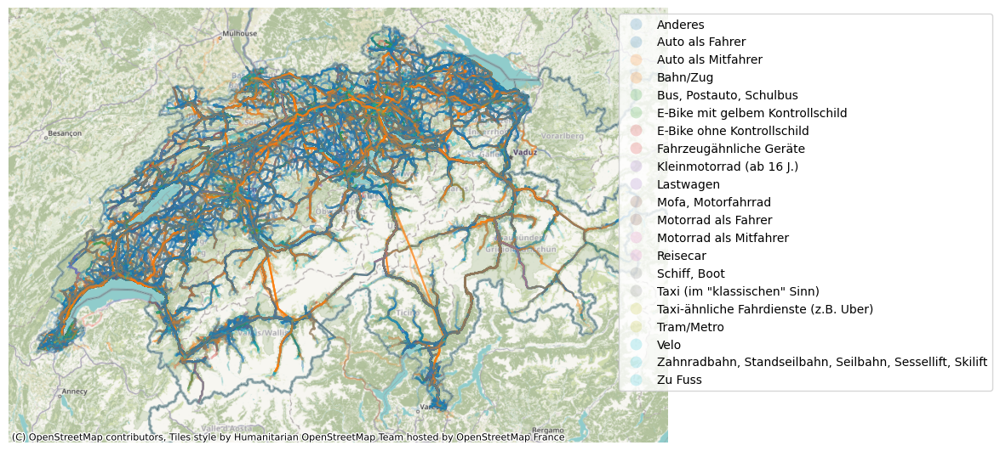

In [25]:
# Das Verkehrsmittel muss erst in eine kategorielle Variable transformiert werden
weg_geo['Verkehrsmittel'] = weg_geo['Verkehrsmittel'].astype('category')

# Ploten ist tiffelig
ax = weg_geo.plot(column='Verkehrsmittel', alpha=0.2, legend=True, figsize=(10, 10))
cx.add_basemap(ax)
ax.set_axis_off()

legend = ax.get_legend()
if legend is not None:
    legend.set_bbox_to_anchor((1.5, 1))
    legend.set_frame_on(True)

## Spatial Join & Intersection

Ähnlich wie über Attribute kann auch über den Raum ge-join-ed werden, entweder über Spatial Join oder Intersection. Anbei ein Beispiel. Es werden dazu die Grenzen (Bezirke, Kantone, usw.) für die Schweiz heruntergeladen (von [hier](https://www.swisstopo.admin.ch/de/landschaftsmodell-swissboundaries3d)).

In [126]:
# URL zum ZIP
url = "https://data.geo.admin.ch/ch.swisstopo.swissboundaries3d/swissboundaries3d_2024-01/swissboundaries3d_2024-01_2056_5728.gpkg.zip"
# ZIP erstellen
zip_filename = "swissboundaries3d.zip"

# Download
response = requests.get(url)
with open(zip_filename, 'wb') as file:
    file.write(response.content)

# ZIP Extrahieren
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall(os.getcwd())

Beim lesen der Daten wählen wir den Layer "Bezirke" aus (ein bisschen grösser als Gemeinden).

In [36]:
ch_bound = gpd.read_file("swissBOUNDARIES3D_1_5_LV95_LN02.gpkg", layer = "tlm_bezirksgebiet")

Die Koordinatensysteme der beiden Datensätze müssen übereinstimmen. Hier konvertieren wir unsere Routen ins Koordinatensystem der Schweizer Grenzen.

In [37]:
ch_bound.crs

<Projected CRS: EPSG:2056>
Name: CH1903+ / LV95
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Liechtenstein; Switzerland.
- bounds: (5.96, 45.82, 10.49, 47.81)
Coordinate Operation:
- name: Swiss Oblique Mercator 1995
- method: Hotine Oblique Mercator (variant B)
Datum: CH1903+
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

In [38]:
weg_geo = weg_geo.to_crs(epsg = 2056)

Left Spatial Join bedeutet, dass allen Wegen (left) die Information der Bezirke zugeordnet wird. Wir wählen hier nur die Reisen von Uri aus.

In [40]:
join_left_df = gpd.sjoin(weg_geo[weg_geo["S_KANTON"] == 4], ch_bound[["name", "geometry"]], how="left")
join_left_df.head(5)

,HHNR,GIS_E_ID,f51300,rdist,length,gppkm,geometry,WP,ETNR,WEGNR,...,km_Str4,km_Str5,km_Str6,km_Str7,km_Str8,GIS_Rech,HAF_FID,Verkehrsmittel,index_right,name
145,110163,2021-05-19T17:05:30.995Z,9,9.510,9.525198,54.172103,"LINESTRING (2695056.258 1189275.561, 2695055.3...",0.650547,1,1,...,2.063,0.0,0.0,5.739,0.0,CAR_FASTEST,NaN,Auto als Fahrer,NaN,NaN
146,110163,2021-05-19T17:16:20.285Z,9,33.442,33.052592,46.108336,"LINESTRING (2691025.936 1191950.627, 2691028.4...",0.650547,2,1,...,-99.000,-99.0,-99.0,-99.000,-99.0,CAR_FASTEST,NaN,Auto als Fahrer,NaN,NaN
147,110163,2021-05-19T17:17:56.360Z,9,14.378,13.650530,70.766483,"LINESTRING (2688756.714 1165379.091, 2688753.6...",0.650547,3,2,...,-99.000,-99.0,-99.0,-99.000,-99.0,CAR_FASTEST,NaN,Auto als Fahrer,NaN,NaN
148,110163,2021-05-19T17:19:37.469Z,9,26.723,26.735912,37.776905,"LINESTRING (2690505.267 1176027.995, 2690495.6...",0.650547,4,3,...,2.677,0.0,0.0,0.209,0.0,CAR_FASTEST,NaN,Auto als Fahrer,NaN,NaN
149,110163,2021-05-19T17:20:38.678Z,9,9.413,9.428032,51.124136,"LINESTRING (2691026.821 1191949.792, 2690985.1...",0.650547,5,4,...,2.122,0.0,0.0,5.628,0.0,CAR_FASTEST,NaN,Auto als Fahrer,NaN,NaN


Uups, wie eigentlich zu erwarten war, fallen einzelne Wege in mehrere Bezirke. Das ist natürlich nicht schön. Um den Fehler zu beheben versuchen wir es mit Intersection. Dabei werden die Wege anhand der Bezirks-Geometrien zerschnitten.

In [42]:
weg_geo_bez = gpd.overlay(weg_geo[weg_geo["S_KANTON"] == 4], ch_bound[["name", "geometry"]], how='intersection')
weg_geo_bez.head(5)

,HHNR,GIS_E_ID,f51300,rdist,length,gppkm,WP,ETNR,WEGNR,pseudo,...,km_Str4,km_Str5,km_Str6,km_Str7,km_Str8,GIS_Rech,HAF_FID,Verkehrsmittel,name,geometry
0,113006,2021-03-16T17:47:52.511Z,9,20.394,20.433438,60.489085,1.325180,1,1,1,...,0.000,0.0,0.000,0.209,0.0,CAR_FASTEST,NaN,Auto als Fahrer,Schwyz,"LINESTRING Z (2690025.062 1200836.015 447.466,..."
1,115545,2021-02-07T17:06:27.806Z,9,50.726,50.817431,32.961131,1.029973,3,3,1,...,6.596,0.0,0.000,0.338,0.0,CAR_FASTEST,NaN,Auto als Fahrer,Luzern-Stadt,"LINESTRING Z (2665352.625 1210137.488 454.563,..."
2,115545,2021-02-07T17:06:27.806Z,9,50.726,50.817431,32.961131,1.029973,3,3,1,...,6.596,0.0,0.000,0.338,0.0,CAR_FASTEST,NaN,Auto als Fahrer,Luzern-Land,MULTILINESTRING Z ((2666362.543 1205596.778 44...
3,122001,2021-02-12T12:35:46.098Z,17,165.302,165.359490,35.697981,1.380236,2,1,1,...,3.891,0.0,0.014,2.437,0.0,CAR_SHORTEST,NaN,Lastwagen,Riviera,"LINESTRING Z (2716697.33 1135076.411 288.469, ..."
4,122001,2021-02-12T12:35:46.098Z,17,165.302,165.359490,35.697981,1.380236,2,1,1,...,3.891,0.0,0.014,2.437,0.0,CAR_SHORTEST,NaN,Lastwagen,Mendrisio,"LINESTRING Z (2719851.643 1085680.933 277.472,..."


Das schein funktioniert zu haben. Nun möchten wir aber pro Wegstück die Länge kennen und dann für jeden Weg die Länge pro Bezirk berechnen.

In [43]:
weg_geo_bez['dist_bezirk'] = weg_geo_bez.geometry.length

weg_bez = weg_geo_bez.groupby(['HHNR', 'GIS_E_ID', 'name', "length"])['dist_bezirk'].sum().reset_index()
weg_bez

,HHNR,GIS_E_ID,name,length,dist_bezirk
0,113006,2021-03-16T17:47:52.511Z,Schwyz,20.433438,9250.091195
1,115545,2021-02-07T17:06:27.806Z,Luzern-Land,50.817431,7183.322027
2,115545,2021-02-07T17:06:27.806Z,Luzern-Stadt,50.817431,6532.932300
3,122001,2021-02-12T12:35:46.098Z,Bellinzona,165.359490,21682.055246
4,122001,2021-02-12T12:35:46.098Z,Leventina,165.359490,42450.042070
...,...,...,...,...,...
206,453891,2021-12-16T20:08:52.612Z,Luzern-Stadt,66.604011,3255.178416
207,456922,2022-01-24T16:48:23.718Z,Einsiedeln,43.867430,4730.862980
208,456922,2022-01-24T16:48:23.718Z,Schwyz,43.867430,27190.236167
209,459622,2022-01-17T16:51:26.821Z,Küssnacht (SZ),39.236682,6696.532907
